# 2nd experiment




- pca dim에 따라 데이터 분산 보존 능력    
- UMAP에서의 구조 보존 차이 확인
- 평가 지표

- data | text 컬럼만 적용
    - law domain data 
        - train
        - test -> valid
    - lbox casename
        - test

- methods          
     pca : umap = m : n

## 0. Import Library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import torch

import re

import warnings
warnings.filterwarnings(action='ignore')

def set_seed(seed: int) -> None:
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)

seed = 1234
set_seed(seed)

In [2]:
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc

# 나눔 폰트 경로를 직접 설정 
font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
fontprop = font_manager.FontProperties(fname=font_path)
plt.rcParams['font.family'] = fontprop.get_name()

In [3]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [4]:
# Hugging Face의 병렬 처리가 비활성화
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

In [5]:
# max_len 도출
from typing import List

def calculate_optimal_max_len(lengths: List[int], thresholds=[64, 128, 256, 512], percentile=90) -> int:
    """
    Calculates the optimal max_len based on the specified percentile of the lengths.
    
    Args:
        lengths (List[int]): List of lengths of each text sample.
        thresholds (List[int]): Possible threshold values to choose from.
        percentile (int): The percentile to use as the cutoff for length.

    Returns:
        int: The optimal max_len based on the given percentile.
    """
    # Calculate the length at the specified percentile
    max_len_suggestion = np.percentile(lengths, percentile)
    
    # Find the closest threshold
    optimal_max_len = min(thresholds, key=lambda x: abs(x - max_len_suggestion))
    
    # Plot length distribution and percentile line
    plt.hist(lengths, bins=30, alpha=0.6, color='b', edgecolor='black')
    plt.axvline(max_len_suggestion, color='red', linestyle='--', label=f'{percentile}th percentile = {int(max_len_suggestion)}')
    plt.axvline(optimal_max_len, color='green', linestyle='-', label=f'Chosen max_len = {optimal_max_len}')
    plt.xlabel('Text Length')
    plt.ylabel('Frequency')
    plt.title('Text Length Distribution with Optimal max_len')
    plt.legend()
    plt.show()
    
    return optimal_max_len

In [6]:
from sklearn.metrics.pairwise import euclidean_distances, cosine_similarity
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_similarity_distance(vector1, vector2, label1="Vector1", label2="Vector2"):

    # 코사인 유사도 및 유클리디안 거리 계산
    similarity_block = cosine_similarity(vector1, vector2)
    euc_distances = euclidean_distances(vector1, vector2)
    
    # 시각화
    plt.figure(figsize=(12, 5))
    
    # 코사인 유사도 히트맵
    plt.subplot(1, 2, 1)
    sns.heatmap(similarity_block, cmap="YlGnBu", xticklabels=False, yticklabels=False)
    plt.title("Cosine Similarity")
    plt.xlabel(label1)
    plt.ylabel(label2)
    
    # 유클리디안 거리 히트맵
    plt.subplot(1, 2, 2)
    sns.heatmap(euc_distances, cmap="YlGnBu", xticklabels=False, yticklabels=False)
    plt.title("Euclidean Distance")
    plt.xlabel(label1)
    plt.ylabel(label2)
    
    plt.tight_layout()
    plt.show()


## 1. Load Data

### Law domain data

In [7]:
law_train = pd.read_csv('../dataset_law/data/train_data.csv')
law_valid = pd.read_csv('../dataset_law/data/val_data.csv')
law_test = pd.read_csv('../dataset_law/data/test_data.csv')

In [8]:
law_train

,class,text
0,i,2) 또한 자동차 열쇠에 대한 배타적인 점유를 취득하는 이상 인근에 주차된 해당 자...
1,w,자기의 행위로 인하여 타인의 사망이라는 결과를 발생시킬 만한 가능성 또는 위험이 있...
2,u,이 사건의 경우 앞서 든 증거들에 의하여 인정되는 다음과 같은 사정들을 고려하여보면
3,c,나. 피고인은 본건 범행 당시 술에 취하여 심신상실 또는 심신미약의 상태에 있었다.
4,d,② 피해자가 피고인에게 먼저 시비를 걸며 부엌에 있던 식칼을 꺼내들고 피고인을 위협...
...,...,...
4073,d,"③ 피고인은 주방으로 가서,"
4074,e,4 M병원에서 작성한 의무기록사본에는 아래와 같은 내용이 기재되어 있다
4075,i,"피고인은 이 사건 범행 당시 우울증 등 정신질환이 있었고,"
4076,c,피고인이 이 사건 범행 당시 음주로 인하여 사물을 변별하거나 의사를 결정할 능력이 ...


In [9]:
law_test

,class,text
0,u,"이 법원이 적법하게 채택하여 조사한 증거에 의하여 인정되는 아래와 같은 사정 즉,"
1,u,"위와 같은 사정들을 모아보면,"
2,u,"앞서 살핀 증거에 의하여 인정되는 다음과 같은 사실 또는 사정을 종합하면,"
3,u,"피고인과 변호인은,"
4,d,(증거기록 제178쪽).
...,...,...
775,b,(2010. 11. 11. 선고 2010도9869 판결 등 참조).
776,d,"피해자를 밀쳐 방바닥으로 떨어뜨리고,"
777,i,피고인은 최초에 칼을 가지고 왔을 때에는 피해자에게 위협만 가할 의사였을 지라도 피...
778,i,"식칼로 피고인을 찌를 의식 없음은 분명하게 표시한 것이고,"


In [10]:
law_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4078 entries, 0 to 4077
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   class   4078 non-null   object
 1   text    4078 non-null   object
dtypes: object(2)
memory usage: 63.8+ KB


In [11]:
law_train.describe()

,class,text
count,4078,4078
unique,8,3832
top,d,"살피건대,"
freq,1360,11


In [12]:
law_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 780 entries, 0 to 779
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   class   780 non-null    object
 1   text    780 non-null    object
dtypes: object(2)
memory usage: 12.3+ KB


In [13]:
law_test.describe()

,class,text
count,780,780
unique,8,755
top,d,(대법원 2009. 2. 26. 선고 2008도9867 판결 등 참조).
freq,274,4


### LBOX - casename data

In [14]:
from datasets import load_dataset
data_cn = load_dataset("lbox/lbox_open", "casename_classification", download_mode="force_redownload")

test_data = data_cn['test']
test = pd.DataFrame(test_data)
lbox_test = test[['casetype', 'casename', 'facts']]

Generating test2 split: 100%|██████████| 1294/1294 [00:00<00:00, 85853.95 examples/s]


In [15]:
lbox_test

,casetype,casename,facts
0,criminal,감염병의예방및관리에관한법률위반,"질병관리청장, 시·도지사 또는 시장·군수·구청장은 감염병이 유행하면 감염병의 전파를..."
1,criminal,감염병의예방및관리에관한법률위반,"질병관리청장, 시․도지사 또는 시장․군수․구청장은 감염병을 예방하기 위하여 감염병의..."
2,criminal,감염병의예방및관리에관한법률위반,보건복지부장관은 2020. 1. 8.경 코로나바이러스감염증-19(이하 ‘코로나-19...
3,criminal,감염병의예방및관리에관한법률위반,"질병관리청장, 시·도지사 또는 시장·군수·구청장은 감염병을 예방하기 위하여 흥행, ..."
4,criminal,감염병의예방및관리에관한법률위반,"피고인들은 수원시 영통구 C, D호에서 E 유흥주점을 공동으로 운영하는 사람들이다...."
...,...,...,...
995,criminal,횡령,피고인은 2019. 5.경 청주시 흥덕구 B에 있는 피해자 C이 운영하는 'D' 주...
996,criminal,횡령,"피고인은 2019. 1. 12.경 전남 목포시 B, 2층 C직업소개소에서 2019...."
997,criminal,횡령,피고인은 2018. 4. 24.경부터 2018. 7. 9.까지 당진시 B에 있는 C...
998,criminal,횡령,범죄전력\n피고인은 2019. 9. 6. 수원지방법원 평택지원에서 횡령죄로 징역 8...


In [16]:
lbox_test.casename.unique()

array(['감염병의예방및관리에관한법률위반', '강제추행', '건물명도(인도)', '건물인도', '게임산업진흥에관한법률위반',
       '공무집행방해', '공무집행방해, 상해', '공무집행방해, 업무방해', '공사대금', '공연음란', '공유물분할',
       '공직선거법위반', '교통사고처리특례법위반(치사)', '교통사고처리특례법위반(치상)',
       '교통사고처리특례법위반(치상), 도로교통법위반(음주운전)', '구상금', '근로기준법위반',
       '근로기준법위반, 근로자퇴직급여보장법위반', '근저당권말소', '기타(금전)', '대여금',
       '도로교통법위반(무면허운전)', '도로교통법위반(무면허운전), 도로교통법위반(음주운전)',
       '도로교통법위반(무면허운전), 도로교통법위반(음주운전), 자동차손해배상보장법위반',
       '도로교통법위반(무면허운전), 도로교통법위반(음주측정거부)',
       '도로교통법위반(사고후미조치), 도로교통법위반(음주운전), 특정범죄가중처벌등에관한법률위반(도주치상)',
       '도로교통법위반(사고후미조치), 특정범죄가중처벌등에관한법률위반(도주치상)', '도로교통법위반(음주운전)',
       '도로교통법위반(음주운전), 특정범죄가중처벌등에관한법률위반(위험운전치상)', '도로교통법위반(음주측정거부)',
       '마약류관리에관한법률위반(대마)', '마약류관리에관한법률위반(대마), 마약류관리에관한법률위반(향정)',
       '마약류관리에관한법률위반(향정)', '매매대금', '매매대금반환', '명예훼손', '모욕', '무고', '물품대금',
       '배당이의', '배상명령신청, 사기', '배상명령신청, 사기, 사문서위조, 위조사문서행사', '배상명령신청, 사기방조',
       '병역법위반', '보증금반환', '보험금', '보험사기방지특별법위반', '부당이득금', '사기',
       '사기, 사문서위조, 위조사문서행사', '사기방조', '사문서위조, 위조사문서행사

## 2. Embedding
Load Model 

In [17]:
# KLUE RoBERTa 모델과 토크나이저 설정
from transformers import AutoModel, AutoTokenizer

model_name = "klue/roberta-base"
tokenizer = AutoTokenizer.from_pretrained(model_name, use_fast=False)
model = AutoModel.from_pretrained(model_name).to(device)

2024-11-25 11:10:48.180264: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-25 11:10:48.186592: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-25 11:10:48.194000: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-25 11:10:48.196239: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-25 11:10:48.202332: I tensorflow/core/platform/cpu_feature_guar

In [14]:
from collections import Counter
# 토큰화
tokens = [token for sentence in law_train["text"] for token in tokenizer.tokenize(sentence)]

# 토큰 빈도 계산
token_counts = Counter(tokens)

# 빈도가 높은 상위 30개 서브워드 출력
print(token_counts.most_common(30))

[('##의', 3605), (',', 3214), ('##을', 2994), ('##에', 2965), ('##이', 2472), ('##는', 2456), ('.', 2328), ('피고인', 2309), ('피해자', 2229), ('##은', 1860), ('##를', 1733), ('있', 1441), ('##고', 1426), ('##가', 1280), ('##하', 1234), ('##다', 1155), ('##한', 1033), ('것', 1020), ('범행', 994), ('##로', 989), ('##었', 968), ('##으로', 927), ('##게', 915), ('이', 824), ('##에서', 722), ('##지', 696), ('등', 665), ('##였', 664), ('##도', 578), ('##과', 574)]


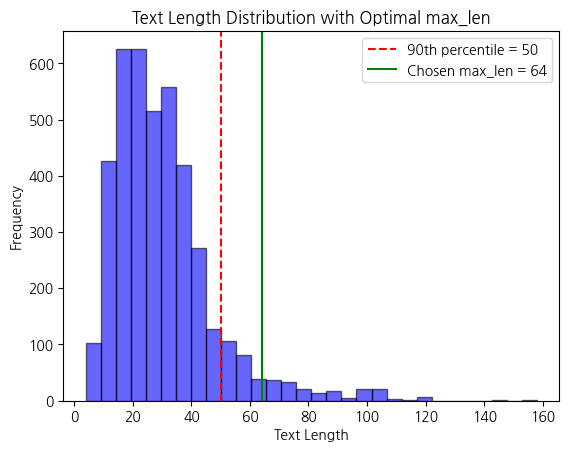

In [15]:
# max_len 길이 구하기
token_lengths = [len(tokenizer.encode(text)) for text in law_train["text"]]

# 최적의 max_len 계산
max_len = calculate_optimal_max_len(token_lengths)

In [33]:
from torch.utils.data import DataLoader, Dataset

# 1. 커스텀 데이터셋 정의
class CustomDataset(Dataset):
    def __init__(self, dataframe):
        self.data = dataframe
        # `text` 또는 `facts` 열 자동 선택
        self.column_name = 'text' if 'text' in dataframe.columns else 'facts'
        self.texts = self.data[self.column_name]

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        return self.texts.iloc[idx]
    
# 2. 데이터셋 준비
train_dataset = CustomDataset(law_train)
valid_dataset = CustomDataset(law_test)
test_dataset = CustomDataset(lbox_test)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=False)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [34]:
# 3. 임베딩 생성 함수
def generate_embeddings(data_loader):
    embeddings = []
    model.eval()
    with torch.no_grad():
        for batch in data_loader:
            inputs = tokenizer(list(batch), return_tensors="pt", padding=True, truncation=True, max_length=512).to("cuda")
            outputs = model(**inputs)
            cls_embeddings = outputs.last_hidden_state[:, 0, :]  # [CLS] 토큰의 임베딩 사용
            embeddings.append(cls_embeddings.cpu())
    return torch.cat(embeddings).numpy()

# 데이터 임베딩 생성
train_embeddings = generate_embeddings(train_loader)
valid_embeddings = generate_embeddings(valid_loader)
test_embeddings = generate_embeddings(test_loader)

In [37]:
train_embeddings[:,]

array([[ 0.12480573, -0.65154123, -0.13723989, ..., -0.15488864,
        -0.13904525,  0.15338804],
       [ 0.1481032 , -0.6659412 , -0.18452108, ..., -0.05383235,
        -0.10154789,  0.15257022],
       [ 0.18604161, -0.65820575, -0.18260251, ..., -0.0943435 ,
        -0.10856107,  0.07603528],
       ...,
       [ 0.1094493 , -0.6528539 , -0.1533926 , ...,  0.00840546,
        -0.16399312,  0.11931542],
       [ 0.04561793, -0.59222525, -0.19238147, ..., -0.00405113,
        -0.15427788,  0.19347899],
       [ 0.08532025, -0.69104815, -0.23065849, ..., -0.08147038,
        -0.12947553,  0.08173373]], dtype=float32)

## 3. base visualization

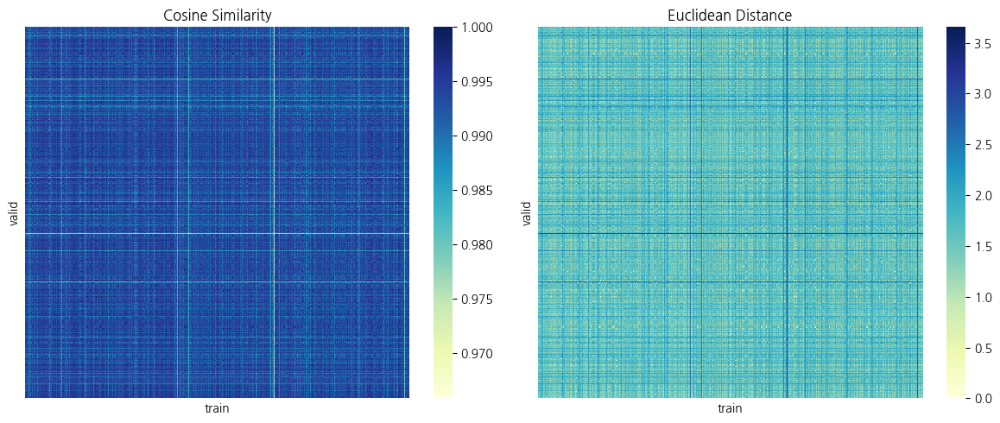

In [38]:
visualize_similarity_distance(train_embeddings, valid_embeddings, 'train', 'valid')

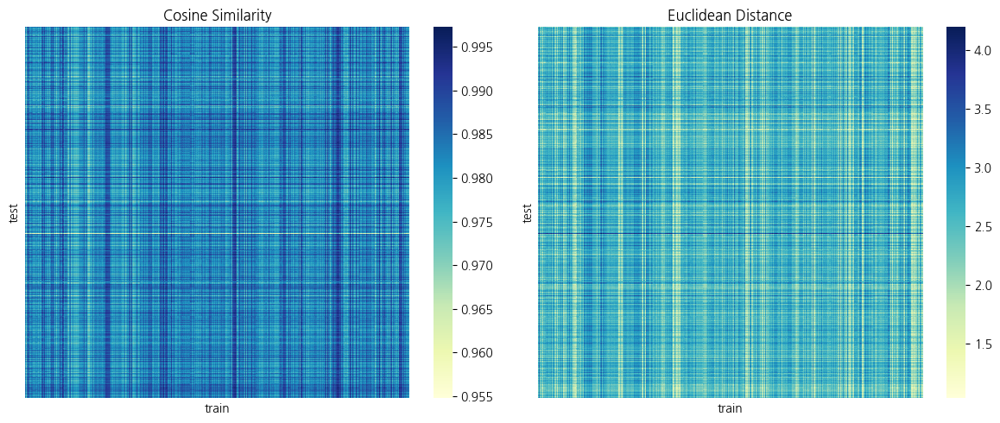

In [39]:
visualize_similarity_distance(train_embeddings, test_embeddings, 'train', 'test')

방향적으로 유사한 형태임을 알 수 있음

### 3.1 T-SNE
- 데이터 간의 세부적인 군집

In [40]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # 3D 시각화를 위한 모듈
import numpy as np

def tsne_plot_2d_3d(embedding_vector1, embedding_vector2, label1="Train", label2="Test"):
    # t-SNE 모델 초기화 및 학습 (2D와 3D 결과를 각각 생성)
    embeddings = np.vstack([embedding_vector1, embedding_vector2])  # 두 데이터를 하나로 결합
    tsne_model_2d = TSNE(
        perplexity=40,
        n_components=2,
        init="random",  # PCA 초기화 대신 무작위 초기화
        n_iter=2500,
        random_state=23
    )
    tsne_model_3d = TSNE(
        perplexity=40,
        n_components=3,
        init="random",  # PCA 초기화 대신 무작위 초기화
        n_iter=2500,
        random_state=23
    )

    tsne_values_2d = tsne_model_2d.fit_transform(embeddings)
    tsne_values_3d = tsne_model_3d.fit_transform(embeddings)

    # 각 데이터의 분리된 레이블 생성
    labels = [label1] * len(embedding_vector1) + [label2] * len(embedding_vector2)

    # t-SNE 결과 분리
    x_2d, y_2d = tsne_values_2d[:, 0], tsne_values_2d[:, 1]
    x_3d, y_3d, z_3d = tsne_values_3d[:, 0], tsne_values_3d[:, 1], tsne_values_3d[:, 2]

    # 시각화 (1x2 서브플롯 생성)
    fig = plt.figure(figsize=(20, 8))

    # 2D 시각화
    ax1 = fig.add_subplot(1, 2, 1)
    for label in set(labels):
        idx = [i for i, lbl in enumerate(labels) if lbl == label]
        ax1.scatter(
            [x_2d[i] for i in idx],
            [y_2d[i] for i in idx],
            label=label,
            s=10, alpha=0.7
        )
    ax1.set_title("2D t-SNE Visualization: " + label1 + ' vs ' + label2, fontsize=15)
    ax1.set_xlabel("t-SNE Dimension 1", fontsize=12)
    ax1.set_ylabel("t-SNE Dimension 2", fontsize=12)
    ax1.legend(loc="best", fontsize=12)

    # 3D 시각화
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    for label in set(labels):
        idx = [i for i, lbl in enumerate(labels) if lbl == label]
        ax2.scatter(
            [x_3d[i] for i in idx],
            [y_3d[i] for i in idx],
            [z_3d[i] for i in idx],
            label=label,
            s=10, alpha=0.7
        )
    ax2.set_title("3D t-SNE Visualization: " + label1 + ' vs ' + label2, fontsize=15)
    ax2.set_xlabel("t-SNE Dimension 1", fontsize=12)
    ax2.set_ylabel("t-SNE Dimension 2", fontsize=12)
    ax2.set_zlabel("t-SNE Dimension 3", fontsize=12)
    ax2.legend(loc="best", fontsize=12)

    # 전체 플롯 표시
    plt.tight_layout()
    plt.show()


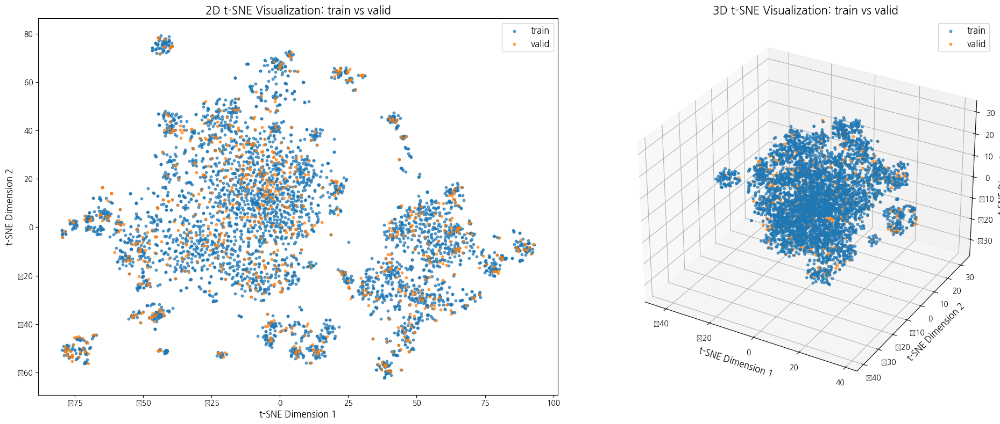

In [41]:
tsne_plot_2d_3d(train_embeddings, valid_embeddings, 'train', 'valid')

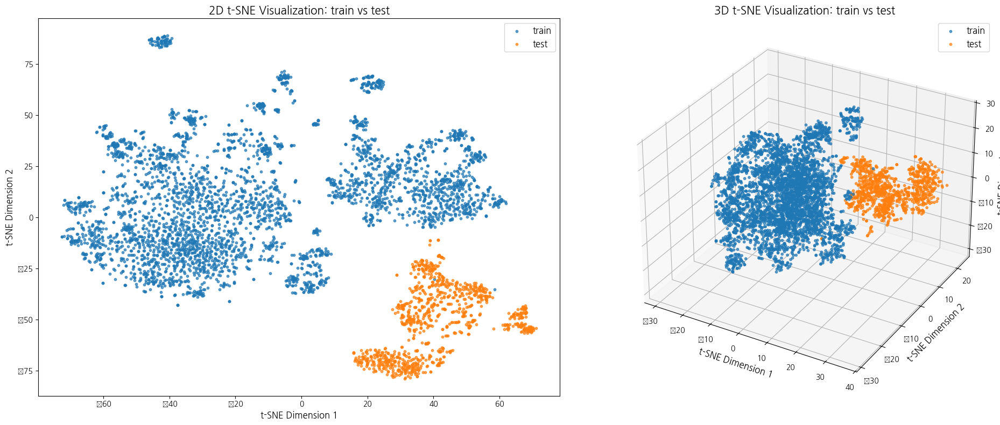

In [42]:
tsne_plot_2d_3d(train_embeddings, test_embeddings, 'train', 'test')

In [43]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import numpy as np

def tsne_density_plot_2d_3d_fixed(embedding_vector1, embedding_vector2, label1="Train", label2="Test"):
    """
    2D 및 3D t-SNE 밀도 플롯
    """
    # t-SNE 모델 학습
    embeddings = np.vstack([embedding_vector1, embedding_vector2])
    
    # 2D t-SNE
    tsne_2d_model = TSNE(n_components=2, perplexity=40, random_state=42)
    new_values_2d = tsne_2d_model.fit_transform(embeddings)
    
    # 3D t-SNE
    tsne_3d_model = TSNE(n_components=3, perplexity=40, random_state=42)
    new_values_3d = tsne_3d_model.fit_transform(embeddings)

    # 데이터 분리
    labels = [label1] * len(embedding_vector1) + [label2] * len(embedding_vector2)
    x_2d, y_2d = new_values_2d[:, 0], new_values_2d[:, 1]
    x_3d, y_3d, z_3d = new_values_3d[:, 0], new_values_3d[:, 1], new_values_3d[:, 2]

    # 1x2 크기의 그래프 생성
    fig = plt.figure(figsize=(16, 8))

    # 2D Density Plot
    ax1 = fig.add_subplot(121)
    sns.kdeplot(x=x_2d, y=y_2d, hue=labels, fill=True, palette="viridis", alpha=0.5, ax=ax1)
    ax1.set_title("2D t-SNE Density Plot: " + label1 + ' vs ' + label2, fontsize=15)
    ax1.set_xlabel("t-SNE Dimension 1")
    ax1.set_ylabel("t-SNE Dimension 2")

    # 3D Plot with label1/label2 distinction
    ax2 = fig.add_subplot(122, projection='3d')
    colors = {label1: 'blue', label2: 'red'}
    for label in set(labels):
        idx = [i for i, lbl in enumerate(labels) if lbl == label]
        ax2.scatter(
            [x_3d[i] for i in idx],
            [y_3d[i] for i in idx],
            [z_3d[i] for i in idx],
            c=colors[label],
            label=label,
            alpha=0.7,
            s=15
        )

    ax2.set_title("3D t-SNE Scatter Plot: " + label1 + ' vs ' + label2, fontsize=15)
    ax2.set_xlabel("t-SNE Dimension 1")
    ax2.set_ylabel("t-SNE Dimension 2")
    ax2.set_zlabel("t-SNE Dimension 3")
    ax2.legend(loc="best", fontsize=12)

    plt.tight_layout()
    plt.show()

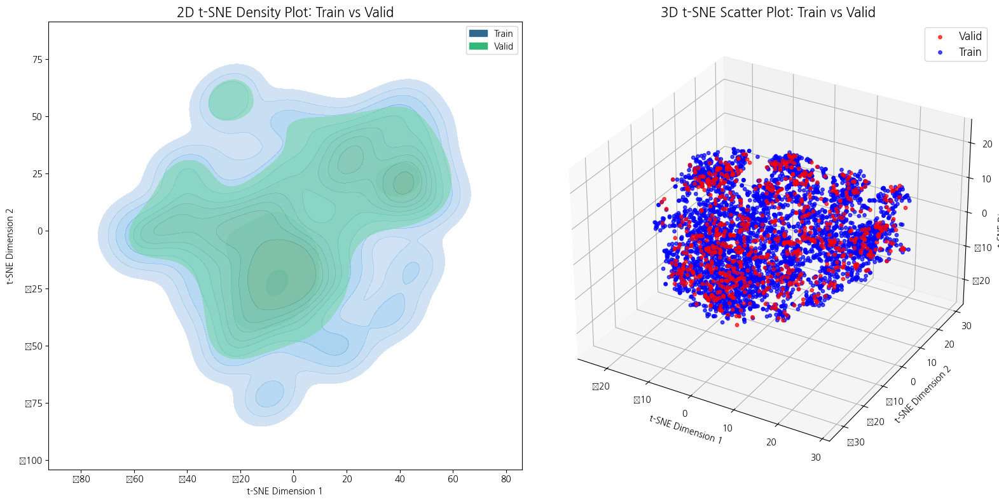

In [44]:
tsne_density_plot_2d_3d_fixed(train_embeddings, valid_embeddings, label1="Train", label2="Valid")

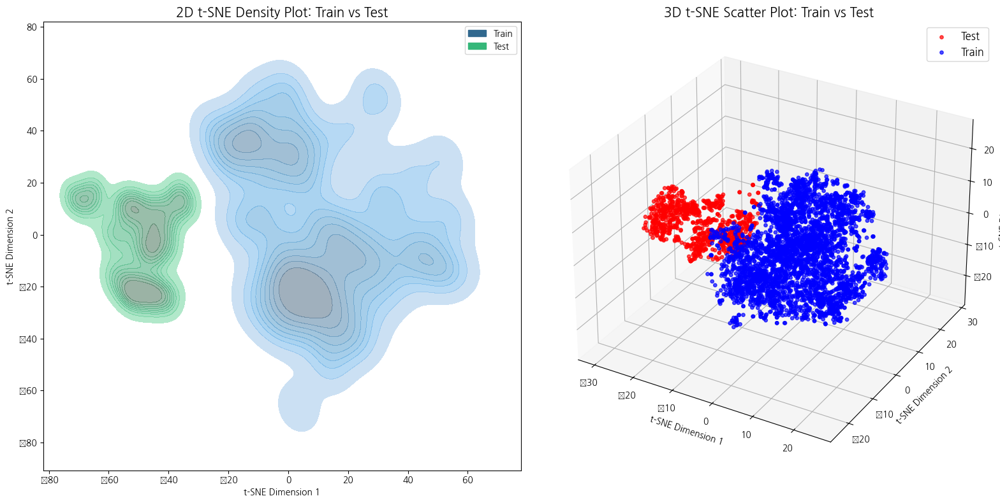

In [45]:
tsne_density_plot_2d_3d_fixed(train_embeddings, test_embeddings, label1="Train", label2="Test")

### 3.2 UMAP

- data 간의 전반적인 군집

In [46]:
# import umap
import umap.umap_ as umap
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # 3D 시각화를 위한 모듈
import numpy as np

def umap_plot_2d_3d(embedding_vector1, embedding_vector2, label1="Train", label2="Test"):

    # UMAP 모델 초기화 및 학습 (2D와 3D 결과를 각각 생성)
    embeddings = np.vstack([embedding_vector1, embedding_vector2])  # 두 데이터를 하나로 결합
    umap_model_2d = umap.UMAP(n_components=2, random_state=42)
    umap_model_3d = umap.UMAP(n_components=3, random_state=42)

    umap_values_2d = umap_model_2d.fit_transform(embeddings)
    umap_values_3d = umap_model_3d.fit_transform(embeddings)

    # Train/Test 데이터의 분리된 레이블 생성
    labels = [label1] * len(embedding_vector1) + [label2] * len(embedding_vector2)

    # UMAP 결과 분리
    x_2d, y_2d = umap_values_2d[:, 0], umap_values_2d[:, 1]
    x_3d, y_3d, z_3d = umap_values_3d[:, 0], umap_values_3d[:, 1], umap_values_3d[:, 2]

    # 시각화 (1x2 서브플롯 생성)
    fig = plt.figure(figsize=(20, 8))

    # 2D 시각화
    ax1 = fig.add_subplot(1, 2, 1)
    for label in set(labels):
        idx = [i for i, lbl in enumerate(labels) if lbl == label]
        ax1.scatter(
            [x_2d[i] for i in idx],
            [y_2d[i] for i in idx],
            label=label,
            s=10, alpha=0.7
        )
    ax1.set_title("2D UMAP Visualization: " + label1 + ' vs ' + label2, fontsize=15)
    ax1.set_xlabel("UMAP Dimension 1", fontsize=12)
    ax1.set_ylabel("UMAP Dimension 2", fontsize=12)
    ax1.legend(loc="best", fontsize=12)

    # 3D 시각화
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    for label in set(labels):
        idx = [i for i, lbl in enumerate(labels) if lbl == label]
        ax2.scatter(
            [x_3d[i] for i in idx],
            [y_3d[i] for i in idx],
            [z_3d[i] for i in idx],
            label=label,
            s=10, alpha=0.7
        )
    ax2.set_title("3D UMAP Visualization: " + label1 + ' vs ' + label2, fontsize=15)
    ax2.set_xlabel("UMAP Dimension 1", fontsize=12)
    ax2.set_ylabel("UMAP Dimension 2", fontsize=12)
    ax2.set_zlabel("UMAP Dimension 3", fontsize=12)
    ax2.legend(loc="best", fontsize=12)

    # 전체 플롯 표시
    plt.tight_layout()
    plt.show()

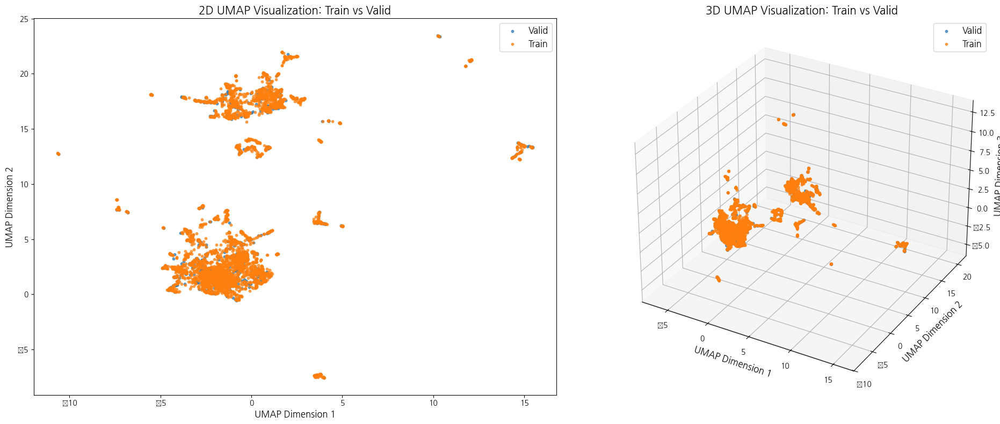

In [47]:
umap_plot_2d_3d(train_embeddings, valid_embeddings, label1="Train", label2="Valid")

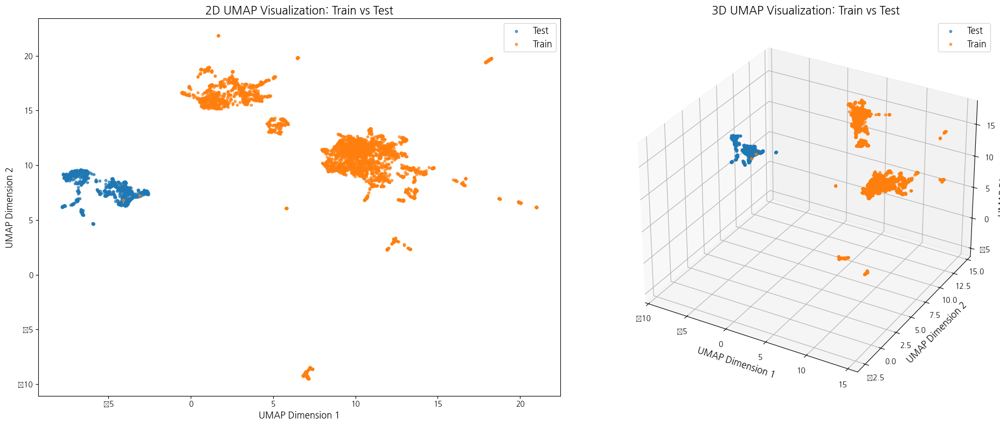

In [48]:
umap_plot_2d_3d(train_embeddings, test_embeddings, label1="Train", label2="Test")

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import umap.umap_ as umap

def umap_density_plot(train_embeddings, test_embeddings, label1="Train", label2="Test"):
    """
    Train과 Test 데이터를 비교하며 UMAP Density Plot을 1x2 서브플롯으로 진행하는 함수.
    - 2D Density Plot
    - 3D Density Plot (Train/Test 구분 강화)

    Args:
        train_embeddings (numpy.ndarray): Train 데이터 임베딩
        test_embeddings (numpy.ndarray): Test 데이터 임베딩
    """
    # Train과 Test 데이터 결합
    embeddings = np.vstack([train_embeddings, test_embeddings])
    labels = ['Train'] * len(train_embeddings) + ['Test'] * len(test_embeddings)

    # UMAP 학습 (2D 및 3D 결과 생성)
    umap_2d_model = umap.UMAP(n_components=2, random_state=42)
    umap_3d_model = umap.UMAP(n_components=3, random_state=42)

    umap_results_2d = umap_2d_model.fit_transform(embeddings)
    umap_results_3d = umap_3d_model.fit_transform(embeddings)

    # 데이터 분리
    x_2d, y_2d = umap_results_2d[:, 0], umap_results_2d[:, 1]
    x_3d, y_3d, z_3d = umap_results_3d[:, 0], umap_results_3d[:, 1], umap_results_3d[:, 2]

    # -------------------------
    # 1x2 서브플롯 생성
    # -------------------------
    fig = plt.figure(figsize=(16, 8))

    # 1. 2D Density Plot
    ax1 = fig.add_subplot(1, 2, 1)
    sns.kdeplot(
        x=x_2d, y=y_2d, hue=labels,
        fill=True, alpha=0.5, palette="viridis", ax=ax1
    )
    ax1.set_title("2D UMAP Density Plot: " + label1 + ' vs ' + label2, fontsize=15)
    ax1.set_xlabel("UMAP Dimension 1")
    ax1.set_ylabel("UMAP Dimension 2")
    ax1.legend(title="Dataset")

    # 2. 3D Scatter Plot (Train/Test 색상 구분)
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')

    # Train/Test 각각 다른 색상으로 시각화
    train_idx = [i for i, lbl in enumerate(labels) if lbl == label1]
    test_idx = [i for i, lbl in enumerate(labels) if lbl == label2]

    ax2.scatter(
        [x_3d[i] for i in train_idx],
        [y_3d[i] for i in train_idx],
        [z_3d[i] for i in train_idx],
        color='blue', label=label1, alpha=0.7, s=15
    )
    ax2.scatter(
        [x_3d[i] for i in test_idx],
        [y_3d[i] for i in test_idx],
        color='red', label=label2, alpha=0.7, s=15
    )

    ax2.set_title("3D UMAP Scatter Plot:  " + label1 + ' vs ' + label2, fontsize=15)
    ax2.set_xlabel("UMAP Dimension 1")
    ax2.set_ylabel("UMAP Dimension 2")
    ax2.set_zlabel("UMAP Dimension 3")
    ax2.legend()

    # 레이아웃 조정 및 플롯 표시
    plt.tight_layout()
    plt.show()

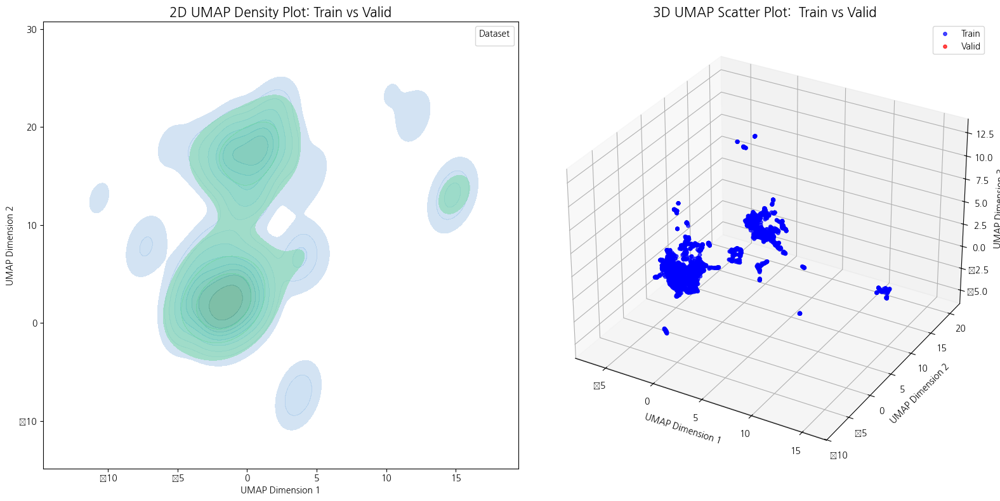

In [50]:
umap_density_plot(train_embeddings, valid_embeddings, label1="Train", label2="Valid")

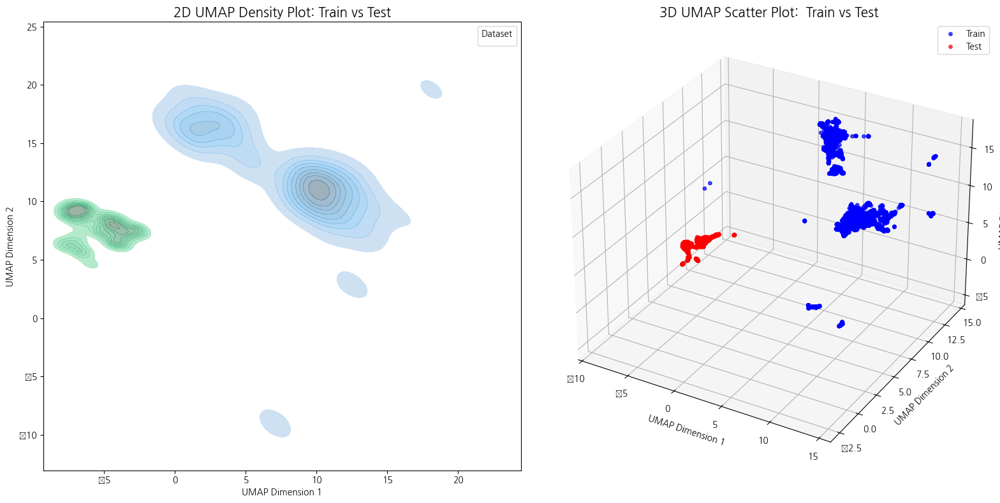

In [51]:
umap_density_plot(train_embeddings, test_embeddings, label1="Train", label2="Test")

## 4. Apply PCA

PCA 적용

In [54]:
print(train_embeddings, valid_embeddings, test_embeddings)
print()
print(train_embeddings.shape, valid_embeddings.shape, test_embeddings.shape)

[[ 0.12480573 -0.65154123 -0.13723989 ... -0.15488864 -0.13904525
   0.15338804]
 [ 0.1481032  -0.6659412  -0.18452108 ... -0.05383235 -0.10154789
   0.15257022]
 [ 0.18604161 -0.65820575 -0.18260251 ... -0.0943435  -0.10856107
   0.07603528]
 ...
 [ 0.1094493  -0.6528539  -0.1533926  ...  0.00840546 -0.16399312
   0.11931542]
 [ 0.04561793 -0.59222525 -0.19238147 ... -0.00405113 -0.15427788
   0.19347899]
 [ 0.08532025 -0.69104815 -0.23065849 ... -0.08147038 -0.12947553
   0.08173373]] [[ 0.13267632 -0.6346643  -0.13796638 ... -0.08926129 -0.10005102
   0.0892822 ]
 [ 0.16854987 -0.67593247 -0.17159268 ... -0.10124084 -0.10301617
   0.05630856]
 [ 0.1776326  -0.7167417  -0.17934674 ... -0.12399857 -0.11687011
   0.12833303]
 ...
 [ 0.0645806  -0.57026905 -0.24829352 ... -0.04080719 -0.14828329
   0.14719252]
 [ 0.13308787 -0.70643294 -0.12103605 ... -0.04529702 -0.14124031
   0.13810131]
 [ 0.10661927 -0.6112596  -0.15273565 ... -0.05857448 -0.10119499
   0.18256176]] [[ 0.0957618  -0

In [57]:
from sklearn.decomposition import PCA

# PCA 적용: 50차원으로 축소
pca_50 = PCA(n_components=50)
ptrain_embeddings = pca_50.fit_transform(train_embeddings)
pvalid_embeddings = pca_50.fit_transform(valid_embeddings)
ptest_embeddings = pca_50.fit_transform(test_embeddings)

# 축소된 데이터 확인
print(f"Original shape: {train_embeddings.shape}")
print(f"PCA reduced shape: {ptrain_embeddings.shape}")

Original shape: (4078, 768)
PCA reduced shape: (4078, 50)


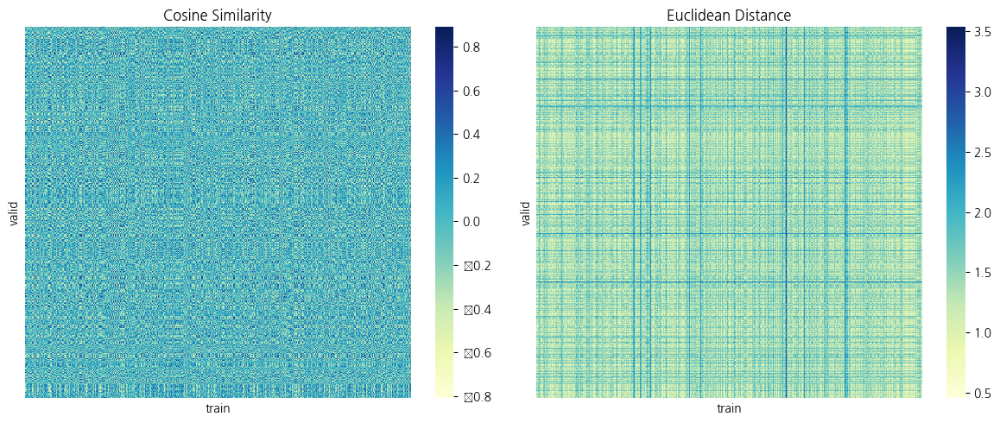

In [58]:
visualize_similarity_distance(ptrain_embeddings, pvalid_embeddings, 'train', 'valid')

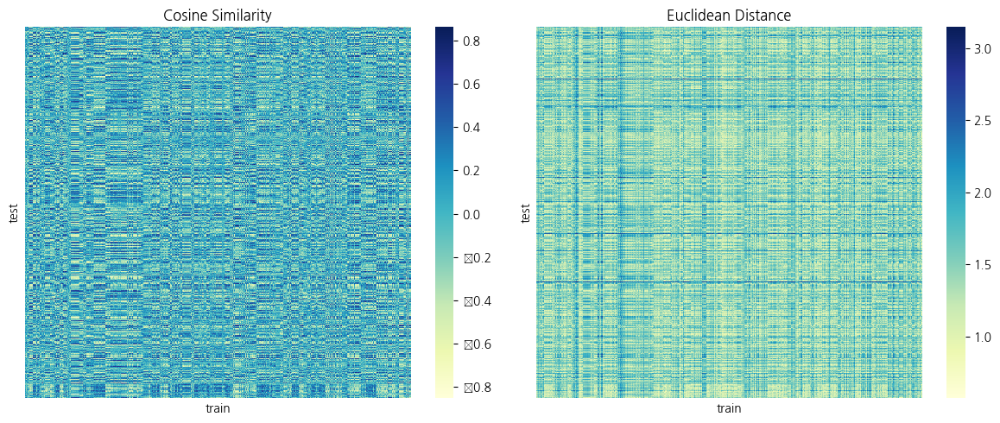

In [60]:
visualize_similarity_distance(ptrain_embeddings, ptest_embeddings, 'train', 'test')

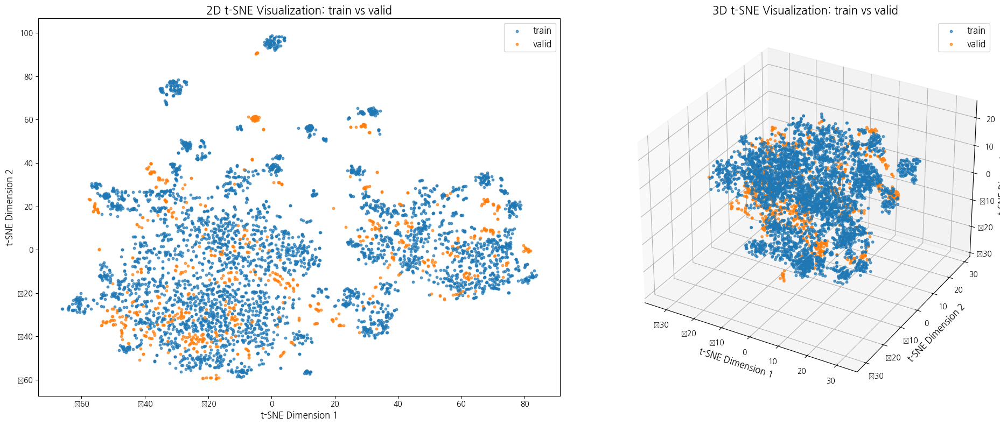

In [61]:
tsne_plot_2d_3d(ptrain_embeddings, pvalid_embeddings, 'train', 'valid')

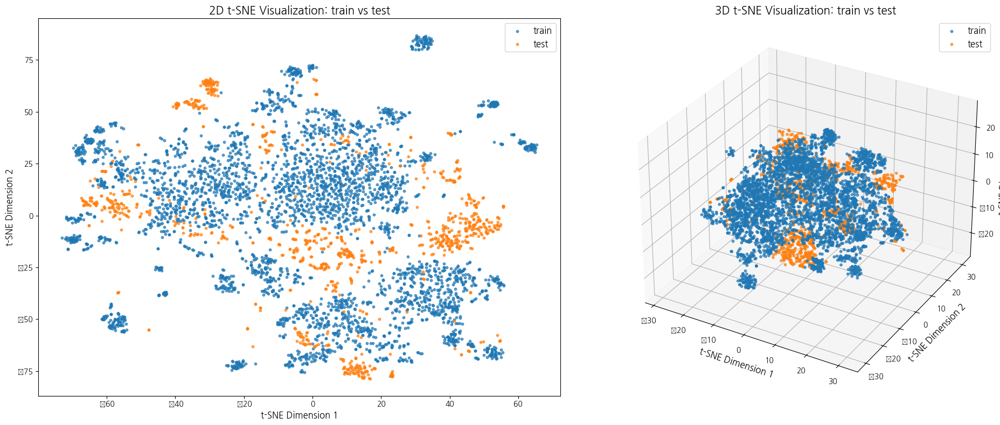

In [62]:
tsne_plot_2d_3d(ptrain_embeddings, ptest_embeddings, 'train', 'test')

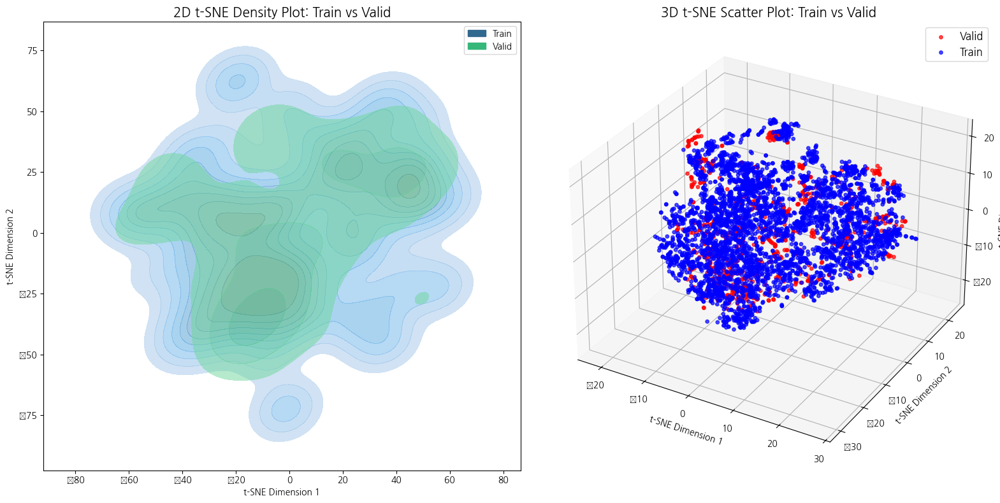

In [63]:
tsne_density_plot_2d_3d_fixed(ptrain_embeddings, pvalid_embeddings, label1="Train", label2="Valid")

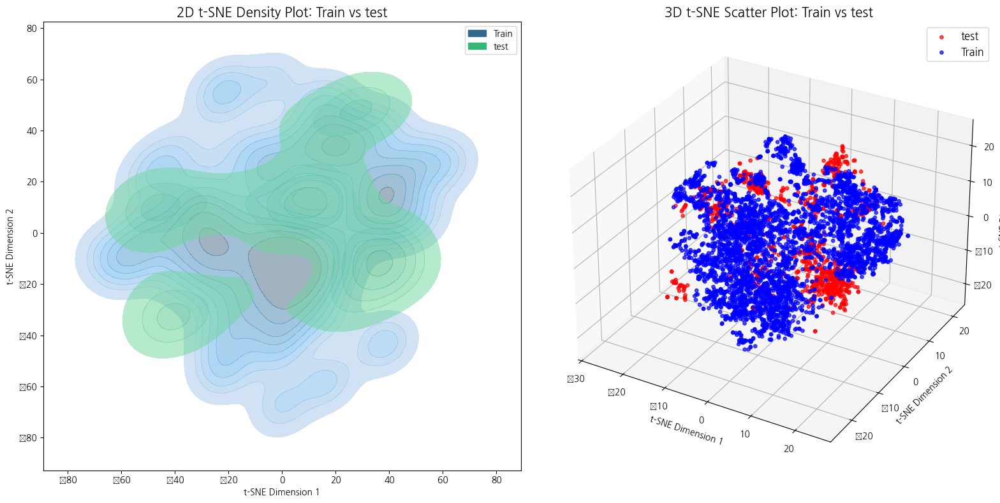

In [64]:
tsne_density_plot_2d_3d_fixed(ptrain_embeddings, ptest_embeddings, label1="Train", label2="test")

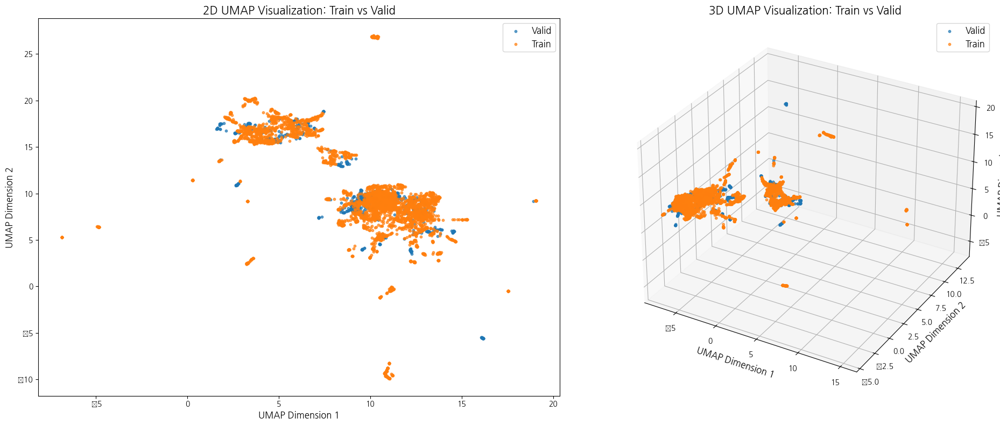

In [65]:
umap_plot_2d_3d(ptrain_embeddings, pvalid_embeddings, label1="Train", label2="Valid")

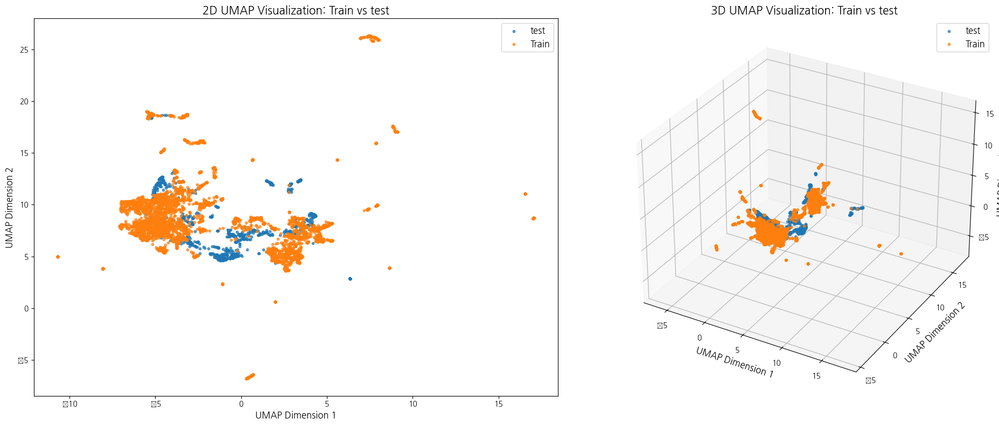

In [66]:
umap_plot_2d_3d(ptrain_embeddings, ptest_embeddings, label1="Train", label2="test")

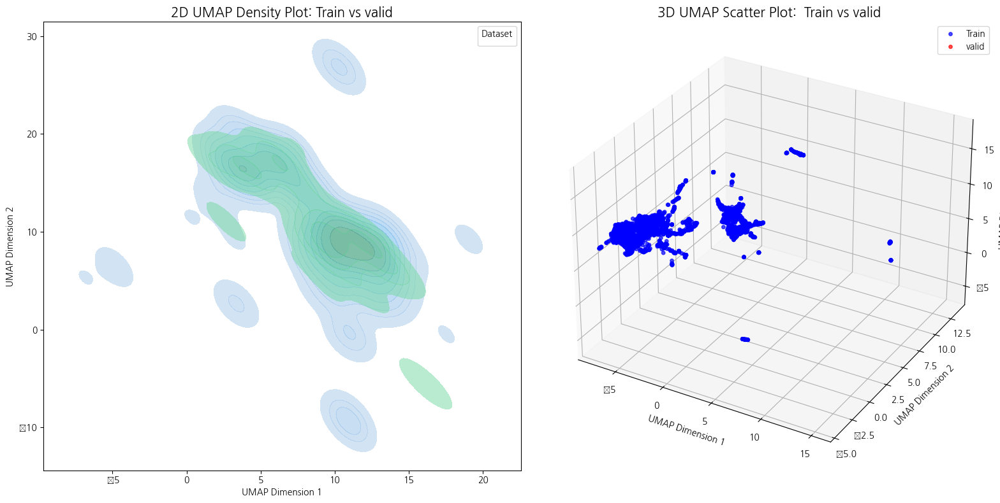

In [69]:
umap_density_plot(ptrain_embeddings, pvalid_embeddings, label1="Train", label2="valid")

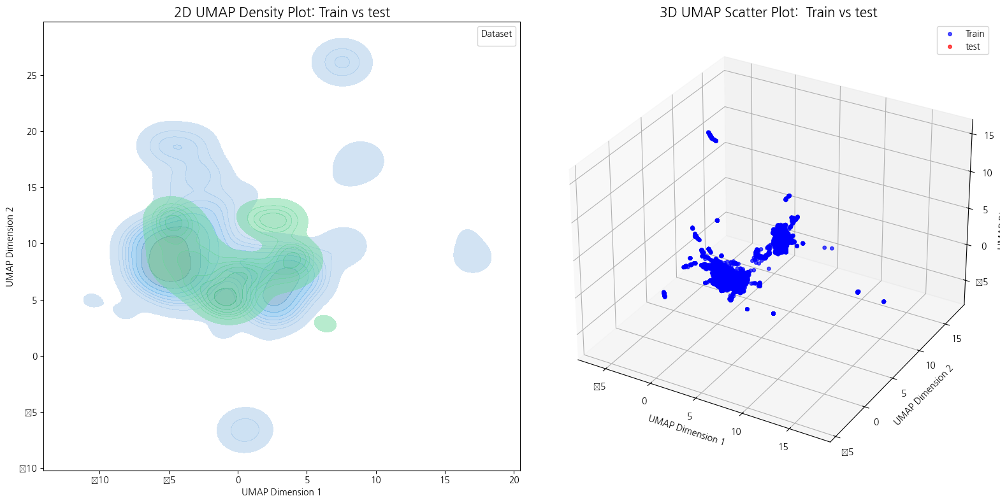

In [70]:
umap_density_plot(ptrain_embeddings, ptest_embeddings, label1="Train", label2="test")

## 5. experiment

### 5.1 pca + umap 
50 30 10 5 각각 비율 조정

In [73]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import umap.umap_ as umap
import numpy as np

def pca_umap_plot(embedding_vector1, embedding_vector2, label1, label2, pca_dim=[50, 30, 10, 5], umap_dim=2):
    """
    PCA로 차원 축소 후 UMAP으로 추가 축소하여 2D/3D 시각화.
    - pca_dim: PCA로 축소할 차원의 리스트 (점진적으로 줄이기)
    - umap_dim: UMAP의 최종 차원 (2 or 3)
    """
    embeddings = np.vstack([embedding_vector1, embedding_vector2])  # Train과 Test 결합
    labels = [label1] * len(embedding_vector1) + [label2] * len(embedding_vector2)  # 레이블 생성

    for dim in pca_dim:
        # PCA 모델 생성 및 적용
        pca_model = PCA(n_components=dim)
        pca_result = pca_model.fit_transform(embeddings)
        
        # 누적 분산 비율 출력
        explained_variance_ratio = pca_model.explained_variance_ratio_
        print(f"PCA {dim} dimensions: Cumulative explained variance = {sum(explained_variance_ratio):.2f}")

        # UMAP 모델 생성 및 적용
        umap_model = umap.UMAP(n_components=umap_dim, random_state=42)
        umap_result = umap_model.fit_transform(pca_result)

        # 시각화
        if umap_dim == 2:
            plt.figure(figsize=(8, 6))
            for label in set(labels):
                idx = [i for i, lbl in enumerate(labels) if lbl == label]
                plt.scatter(
                    [umap_result[i, 0] for i in idx],
                    [umap_result[i, 1] for i in idx],
                    label=label,
                    s=10, alpha=0.7
                )
            plt.title(f"PCA ({dim} dims) + UMAP ({umap_dim}D): {label1} vs {label2}", fontsize=15)
            plt.xlabel("UMAP Dimension 1", fontsize=12)
            plt.ylabel("UMAP Dimension 2", fontsize=12)
            plt.legend(loc="best", fontsize=12)
            plt.show()

        elif umap_dim == 3:
            fig = plt.figure(figsize=(10, 8))
            ax = fig.add_subplot(111, projection='3d')
            for label in set(labels):
                idx = [i for i, lbl in enumerate(labels) if lbl == label]
                ax.scatter(
                    [umap_result[i, 0] for i in idx],
                    [umap_result[i, 1] for i in idx],
                    [umap_result[i, 2] for i in idx],
                    label=label,
                    s=10, alpha=0.7
                )
            ax.set_title(f"PCA ({dim} dims) + UMAP ({umap_dim}D): {label1} vs {label2}", fontsize=15)
            ax.set_xlabel("UMAP Dimension 1", fontsize=12)
            ax.set_ylabel("UMAP Dimension 2", fontsize=12)
            ax.set_zlabel("UMAP Dimension 3", fontsize=12)
            ax.legend(loc="best", fontsize=12)
            plt.show()

PCA 50 dimensions: Cumulative explained variance = 1.00


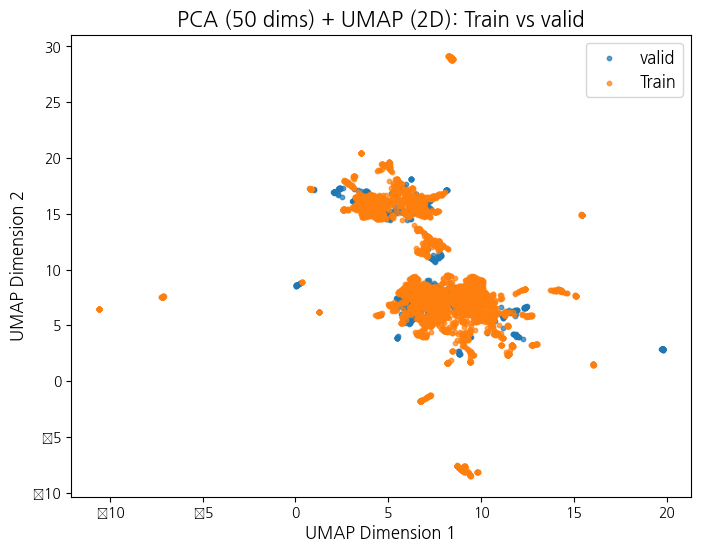

PCA 30 dimensions: Cumulative explained variance = 0.89


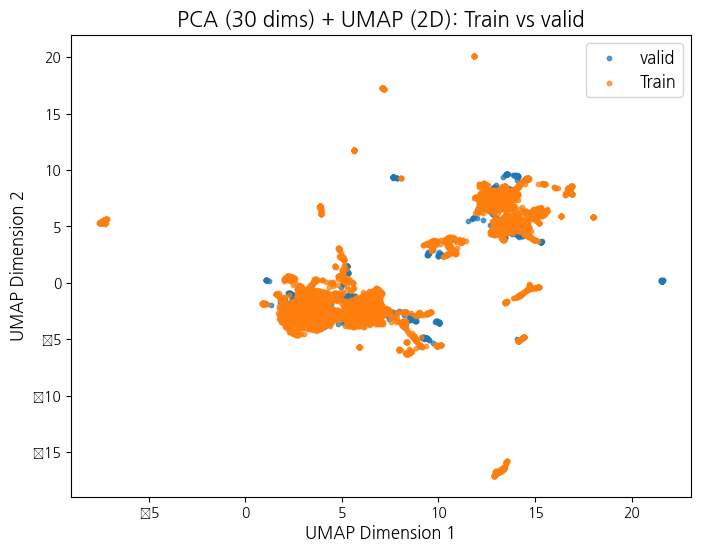

PCA 10 dimensions: Cumulative explained variance = 0.64


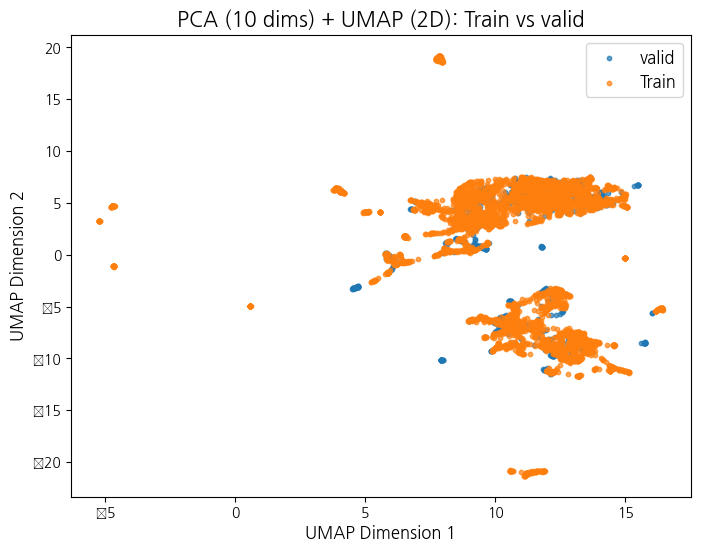

PCA 5 dimensions: Cumulative explained variance = 0.48


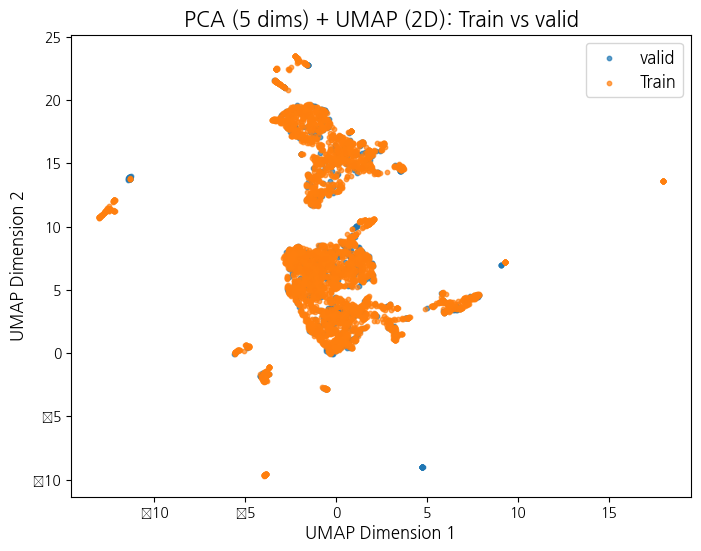

In [75]:
pca_umap_plot(ptrain_embeddings, pvalid_embeddings, label1="Train", label2="valid")

PCA 50 dimensions: Cumulative explained variance = 1.00


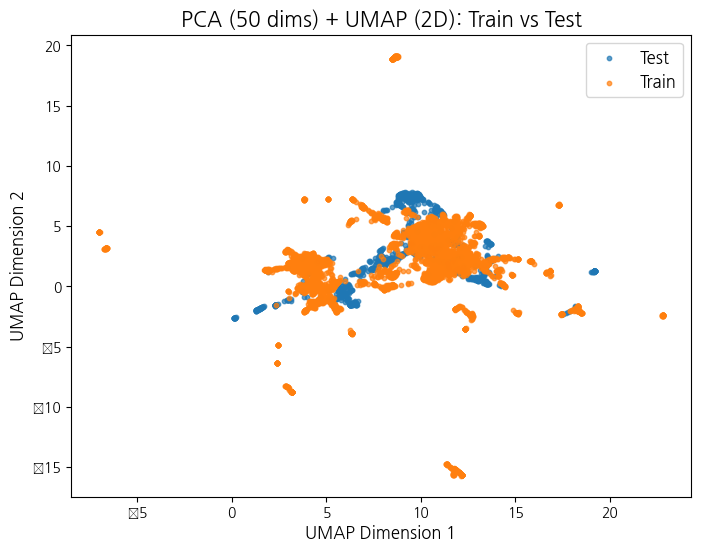

PCA 30 dimensions: Cumulative explained variance = 0.89


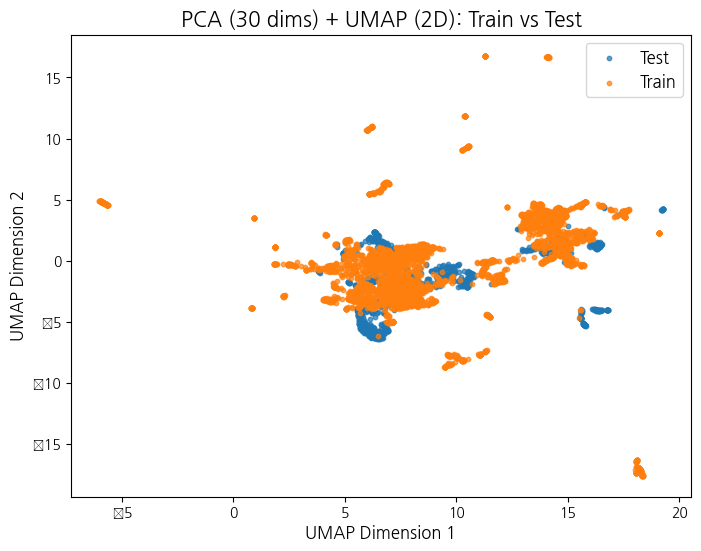

PCA 10 dimensions: Cumulative explained variance = 0.66


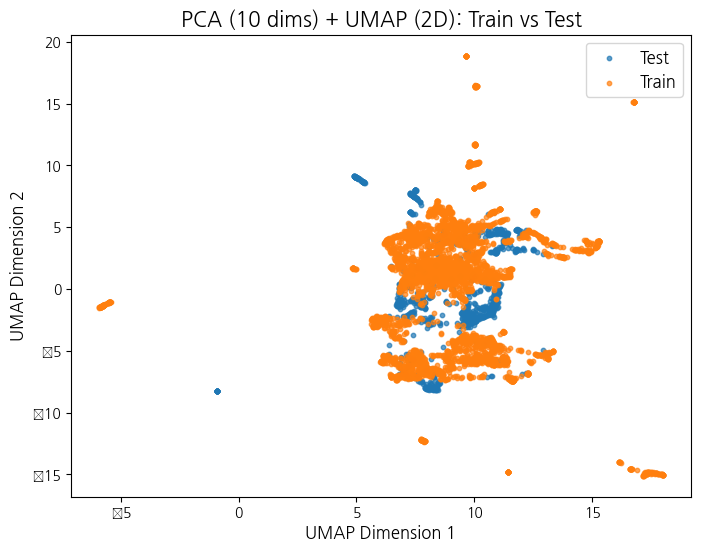

PCA 5 dimensions: Cumulative explained variance = 0.51


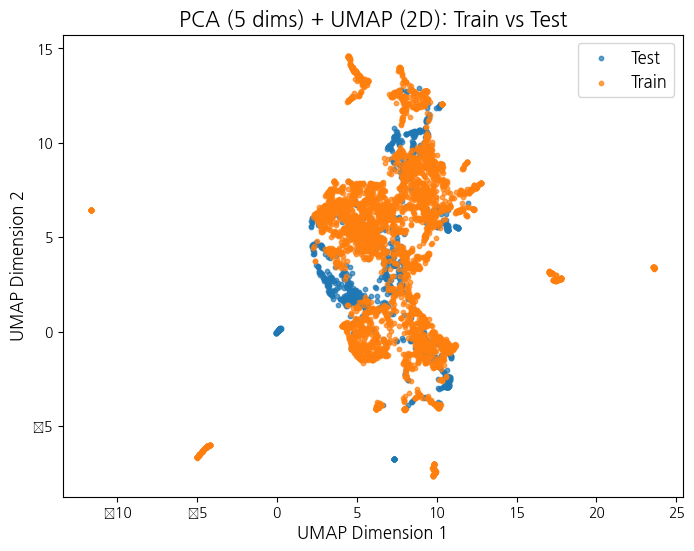

In [74]:
pca_umap_plot(ptrain_embeddings, ptest_embeddings, label1="Train", label2="Test")

In [83]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import umap.umap_ as umap
import numpy as np
from mpl_toolkits.mplot3d import Axes3D  # 3D 시각화를 위한 모듈

def pca_umap_plot_3D(embedding_vector1, embedding_vector2, label1="Train", label2="Test", pca_dim=[50, 30, 10, 5], umap_dim=3):
    """
    PCA로 차원 축소 후 UMAP으로 추가 축소하여 2D/3D 시각화.
    - pca_dim: PCA로 축소할 차원의 리스트 (점진적으로 줄이기)
    - umap_dim: UMAP의 최종 차원 (2 or 3)
    """
    embeddings = np.vstack([embedding_vector1, embedding_vector2])  # Train과 Test 결합
    labels = [label1] * len(embedding_vector1) + [label2] * len(embedding_vector2)  # 레이블 생성

    for dim in pca_dim:
        # PCA 모델 생성 및 적용
        pca_model = PCA(n_components=dim)
        pca_result = pca_model.fit_transform(embeddings)
        
        # 누적 분산 비율 출력
        explained_variance_ratio = pca_model.explained_variance_ratio_
        print(f"PCA {dim} dimensions: Cumulative explained variance = {sum(explained_variance_ratio):.2f}")

        # UMAP 모델 생성 및 적용
        umap_model = umap.UMAP(n_components=umap_dim, random_state=42)
        umap_result = umap_model.fit_transform(pca_result)

        # 시각화
        if umap_dim == 2:
            plt.figure(figsize=(8, 6))
            for label in set(labels):
                idx = [i for i, lbl in enumerate(labels) if lbl == label]
                plt.scatter(
                    [umap_result[i, 0] for i in idx],
                    [umap_result[i, 1] for i in idx],
                    label=label,
                    s=10, alpha=0.7
                )
            plt.title(f"PCA ({dim} dims) + UMAP ({umap_dim}D): {label1} vs {label2}", fontsize=15)
            plt.xlabel("UMAP Dimension 1", fontsize=12)
            plt.ylabel("UMAP Dimension 2", fontsize=12)
            plt.legend(loc="best", fontsize=12)
            plt.show()

        elif umap_dim == 3:
            fig = plt.figure(figsize=(10, 8))
            ax = fig.add_subplot(111, projection='3d')
            for label in set(labels):
                idx = [i for i, lbl in enumerate(labels) if lbl == label]
                ax.scatter(
                    [umap_result[i, 0] for i in idx],
                    [umap_result[i, 1] for i in idx],
                    [umap_result[i, 2] for i in idx],
                    label=label,
                    s=10, alpha=0.7
                )
            ax.set_title(f"PCA ({dim} dims) + UMAP ({umap_dim}D): {label1} vs {label2}", fontsize=15)
            ax.set_xlabel("UMAP Dimension 1", fontsize=12)
            ax.set_ylabel("UMAP Dimension 2", fontsize=12)
            ax.set_zlabel("UMAP Dimension 3", fontsize=12)
            ax.legend(loc="best", fontsize=12)
            plt.show()

PCA 50 dimensions: Cumulative explained variance = 1.00


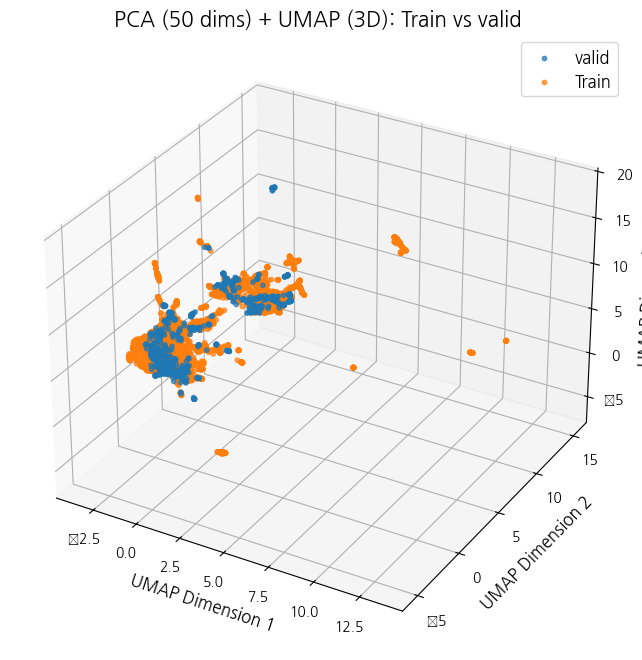

PCA 30 dimensions: Cumulative explained variance = 0.89


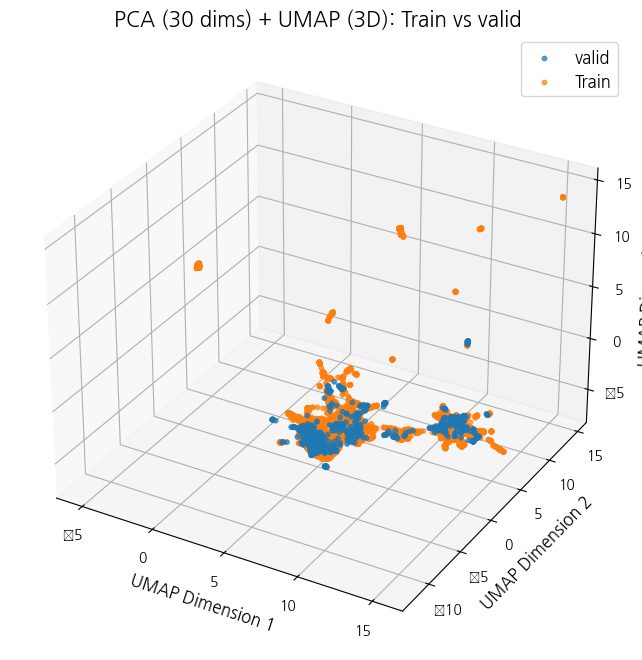

PCA 10 dimensions: Cumulative explained variance = 0.64


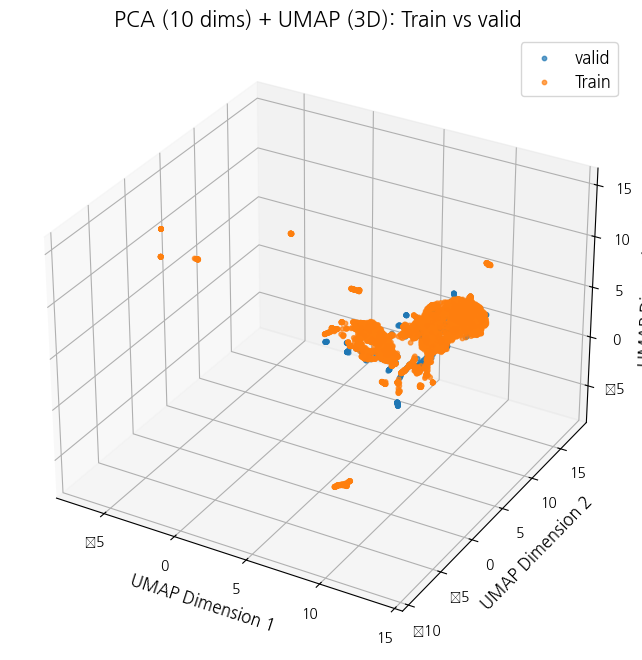

PCA 5 dimensions: Cumulative explained variance = 0.48


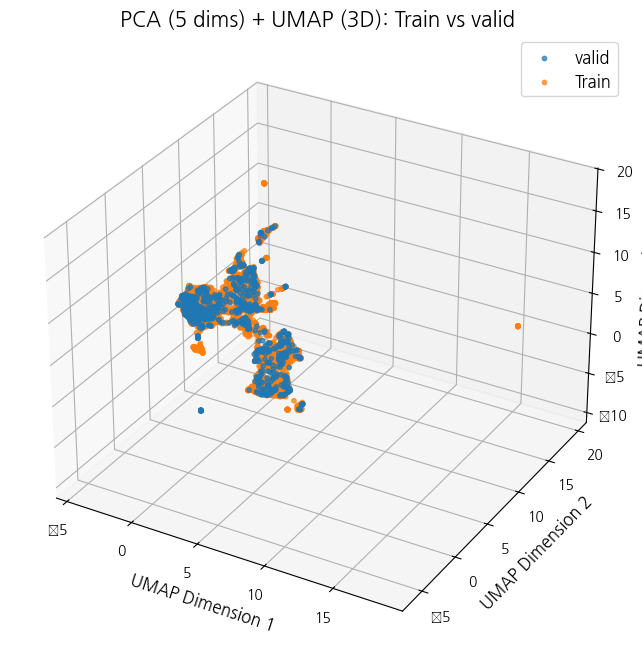

In [84]:
pca_umap_plot_3D(ptrain_embeddings, pvalid_embeddings, label1="Train", label2="valid")

In [ ]:
pca_umap_plot_3D(ptrain_embeddings, ptest_embeddings, label1="Train", label2="Test")